In [1]:
pip install numpy scipy matplotlib


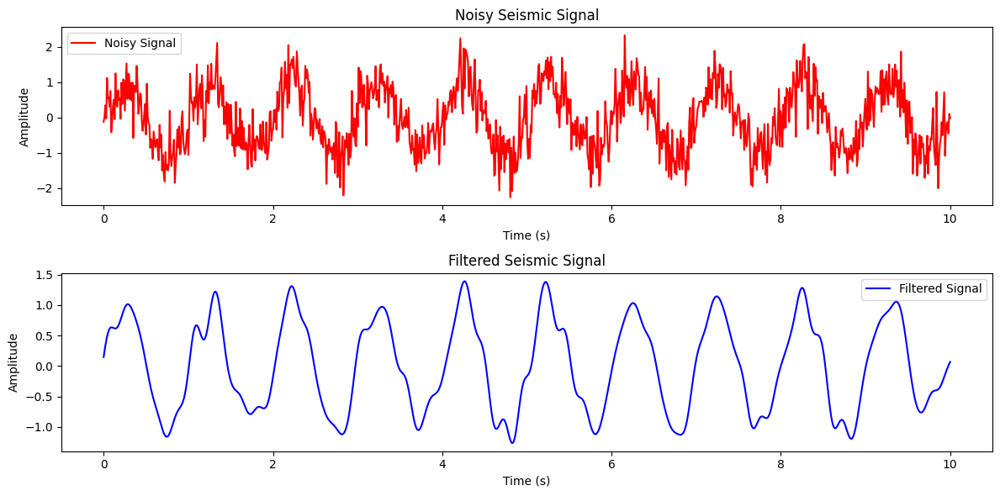

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt

# Generate sample seismic data with noise
def generate_seismic_data(duration=10, fs=100, freq=1):
    t = np.linspace(0, duration, duration * fs)
    # Simulated seismic wave (sine wave)
    signal = np.sin(2 * np.pi * freq * t)
    # Adding random noise
    noise = np.random.normal(0, 0.5, signal.shape)
    noisy_signal = signal + noise
    return t, noisy_signal

# Bandpass filter design
def bandpass_filter(data, lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data)
    return filtered_data

# Main processing function
def main():
    # Generate noisy seismic data
    fs = 100  # Sampling frequency
    t, noisy_signal = generate_seismic_data()

    # Define filter parameters
    lowcut = 0.5  # Low cutoff frequency (Hz)
    highcut = 5.0  # High cutoff frequency (Hz)

    # Apply bandpass filter
    filtered_signal = bandpass_filter(noisy_signal, lowcut, highcut, fs)

    # Plot the results
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='red')
    plt.title('Noisy Seismic Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.plot(t, filtered_signal, label='Filtered Signal', color='blue')
    plt.title('Filtered Seismic Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()

    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    main()


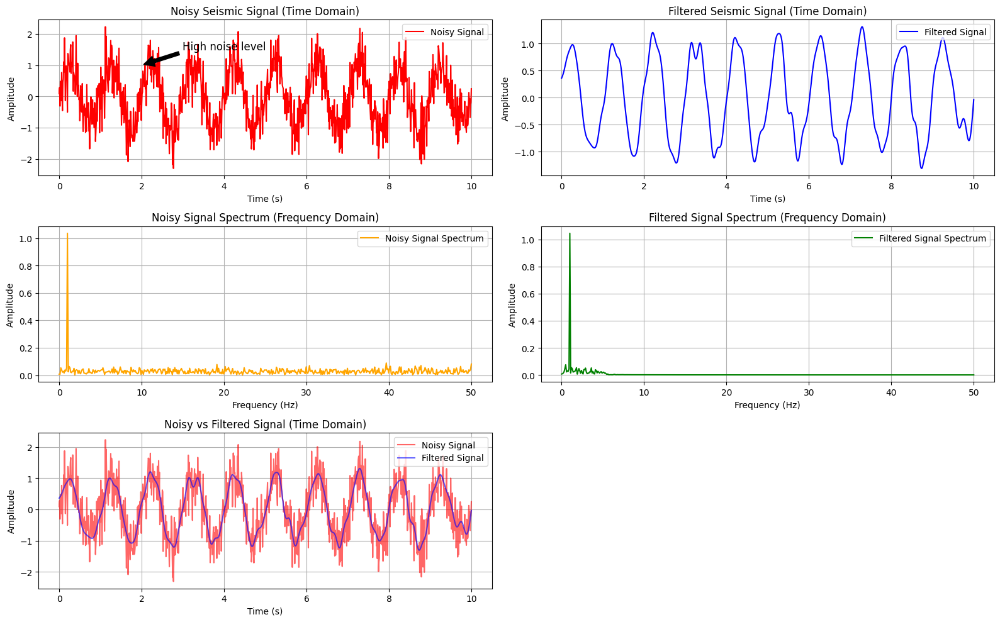

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
from scipy.fftpack import fft
from typing import Tuple

# Generate sample seismic data with noise
def generate_seismic_data(duration: int = 10, fs: int = 100, freq: float = 1, noise_level: float = 0.5) -> Tuple[np.ndarray, np.ndarray]:
    t = np.linspace(0, duration, duration * fs)
    signal = np.sin(2 * np.pi * freq * t)
    noise = np.random.normal(0, noise_level, signal.shape)
    noisy_signal = signal + noise
    return t, noisy_signal

# Bandpass filter design
def bandpass_filter(data: np.ndarray, lowcut: float, highcut: float, fs: int, order: int = 5) -> np.ndarray:
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    if low <= 0 or high >= 1:
        raise ValueError("Invalid cutoff frequencies. They must be between 0 and Nyquist frequency.")
    b, a = butter(order, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data)
    return filtered_data

# Function to compute FFT and return frequency and amplitude
def compute_fft(data: np.ndarray, fs: int) -> Tuple[np.ndarray, np.ndarray]:
    N = len(data)
    T = 1.0 / fs
    yf = fft(data)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    return xf, 2.0/N * np.abs(yf[:N//2])

# Advanced plotting
def plot_signals(t: np.ndarray, noisy_signal: np.ndarray, filtered_signal: np.ndarray, fs: int):
    # Compute FFT for both signals
    xf_noisy, yf_noisy = compute_fft(noisy_signal, fs)
    xf_filtered, yf_filtered = compute_fft(filtered_signal, fs)

    # Set up the plotting layout
    fig, axs = plt.subplots(3, 2, figsize=(16, 10))

    # Time domain: Noisy signal
    axs[0, 0].plot(t, noisy_signal, color='red', label='Noisy Signal')
    axs[0, 0].set_title('Noisy Seismic Signal (Time Domain)')
    axs[0, 0].set_xlabel('Time (s)')
    axs[0, 0].set_ylabel('Amplitude')
    axs[0, 0].legend(loc='upper right')
    axs[0, 0].grid(True, which='both')

    # Time domain: Filtered signal
    axs[0, 1].plot(t, filtered_signal, color='blue', label='Filtered Signal')
    axs[0, 1].set_title('Filtered Seismic Signal (Time Domain)')
    axs[0, 1].set_xlabel('Time (s)')
    axs[0, 1].set_ylabel('Amplitude')
    axs[0, 1].legend(loc='upper right')
    axs[0, 1].grid(True, which='both')

    # Frequency domain: Noisy signal
    axs[1, 0].plot(xf_noisy, yf_noisy, color='orange', label='Noisy Signal Spectrum')
    axs[1, 0].set_title('Noisy Signal Spectrum (Frequency Domain)')
    axs[1, 0].set_xlabel('Frequency (Hz)')
    axs[1, 0].set_ylabel('Amplitude')
    axs[1, 0].legend(loc='upper right')
    axs[1, 0].grid(True, which='both')

    # Frequency domain: Filtered signal
    axs[1, 1].plot(xf_filtered, yf_filtered, color='green', label='Filtered Signal Spectrum')
    axs[1, 1].set_title('Filtered Signal Spectrum (Frequency Domain)')
    axs[1, 1].set_xlabel('Frequency (Hz)')
    axs[1, 1].set_ylabel('Amplitude')
    axs[1, 1].legend(loc='upper right')
    axs[1, 1].grid(True, which='both')

    # Plot comparison of noisy and filtered signals
    axs[2, 0].plot(t, noisy_signal, label='Noisy Signal', color='red', alpha=0.6)
    axs[2, 0].plot(t, filtered_signal, label='Filtered Signal', color='blue', alpha=0.6)
    axs[2, 0].set_title('Noisy vs Filtered Signal (Time Domain)')
    axs[2, 0].set_xlabel('Time (s)')
    axs[2, 0].set_ylabel('Amplitude')
    axs[2, 0].legend(loc='upper right')
    axs[2, 0].grid(True, which='both')

    # Hide the last subplot
    axs[2, 1].axis('off')

    # Add annotation box
    axs[0, 0].annotate('High noise level', xy=(2, 1), xytext=(3, 1.5),
                       arrowprops=dict(facecolor='black', shrink=0.05),
                       fontsize=12, color='black')

    # Tight layout for better spacing
    plt.tight_layout()
    plt.show()

# Main processing function
def main():
    fs = 100  # Sampling frequency
    t, noisy_signal = generate_seismic_data()

    # Define filter parameters
    lowcut = 0.5  # Low cutoff frequency (Hz)
    highcut = 5.0  # High cutoff frequency (Hz)

    try:
        # Apply bandpass filter
        filtered_signal = bandpass_filter(noisy_signal, lowcut, highcut, fs)

        # Advanced plotting
        plot_signals(t, noisy_signal, filtered_signal, fs)
        
    except ValueError as e:
        print(f"Error applying filter: {e}")

if __name__ == '__main__':
    main()




In [23]:
import plotly
print(plotly.__version__)


5.24.1


In [24]:
import numpy as np
import plotly.graph_objs as go
import plotly.subplots as sp
from scipy.signal import butter, filtfilt, spectrogram
from scipy.fftpack import fft
from typing import Tuple

# Generate sample seismic data with noise
def generate_seismic_data(duration: int = 10, fs: int = 100, freq: float = 1, noise_level: float = 0.5) -> Tuple[np.ndarray, np.ndarray]:
    t = np.linspace(0, duration, duration * fs)
    signal = np.sin(2 * np.pi * freq * t)
    noise = np.random.normal(0, noise_level, signal.shape)
    noisy_signal = signal + noise
    return t, noisy_signal

# Bandpass filter design
def bandpass_filter(data: np.ndarray, lowcut: float, highcut: float, fs: int, order: int = 5) -> np.ndarray:
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    if low <= 0 or high >= 1:
        raise ValueError("Invalid cutoff frequencies. They must be between 0 and Nyquist frequency.")
    b, a = butter(order, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data)
    return filtered_data

# Function to compute FFT and return frequency and amplitude
def compute_fft(data: np.ndarray, fs: int) -> Tuple[np.ndarray, np.ndarray]:
    N = len(data)
    T = 1.0 / fs
    yf = fft(data)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    return xf, 2.0/N * np.abs(yf[:N//2])

# Function to create a spectrogram
def create_spectrogram(data: np.ndarray, fs: int) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    f, t, Sxx = spectrogram(data, fs=fs)
    return f, t, Sxx

# Advanced interactive plotting with Plotly
def plot_advanced(t: np.ndarray, noisy_signal: np.ndarray, filtered_signal: np.ndarray, fs: int):
    # Compute FFT for both signals
    xf_noisy, yf_noisy = compute_fft(noisy_signal, fs)
    xf_filtered, yf_filtered = compute_fft(filtered_signal, fs)

    # Compute spectrogram of noisy and filtered signals
    f_noisy, t_noisy, Sxx_noisy = create_spectrogram(noisy_signal, fs)
    f_filtered, t_filtered, Sxx_filtered = create_spectrogram(filtered_signal, fs)

    # Create a subplot layout (3x2) for time-domain, frequency-domain, and spectrogram views
    fig = sp.make_subplots(rows=3, cols=2, subplot_titles=(
        "Noisy Signal (Time Domain)", "Filtered Signal (Time Domain)",
        "Noisy Signal Spectrum (Frequency Domain)", "Filtered Signal Spectrum (Frequency Domain)",
        "Noisy Signal Spectrogram", "Filtered Signal Spectrogram"),
        vertical_spacing=0.15,
        specs=[[{"type": "scatter"}, {"type": "scatter"}],
               [{"type": "scatter"}, {"type": "scatter"}],
               [{"type": "heatmap"}, {"type": "heatmap"}]])

    # Time-domain plots
    fig.add_trace(go.Scatter(x=t, y=noisy_signal, mode='lines', name="Noisy Signal", line=dict(color='red')),
                  row=1, col=1)
    fig.add_trace(go.Scatter(x=t, y=filtered_signal, mode='lines', name="Filtered Signal", line=dict(color='blue')),
                  row=1, col=2)

    # Frequency-domain (FFT) plots
    fig.add_trace(go.Scatter(x=xf_noisy, y=yf_noisy, mode='lines', name="Noisy Spectrum", line=dict(color='orange')),
                  row=2, col=1)
    fig.add_trace(go.Scatter(x=xf_filtered, y=yf_filtered, mode='lines', name="Filtered Spectrum", line=dict(color='green')),
                  row=2, col=2)

    # Spectrograms (Noisy & Filtered)
    fig.add_trace(go.Heatmap(z=10 * np.log10(Sxx_noisy), x=t_noisy, y=f_noisy, colorscale='Viridis', name="Noisy Spectrogram"),
                  row=3, col=1)
    fig.add_trace(go.Heatmap(z=10 * np.log10(Sxx_filtered), x=t_filtered, y=f_filtered, colorscale='Viridis', name="Filtered Spectrogram"),
                  row=3, col=2)

    # Customize layout
    fig.update_layout(
        title="Seismic Signal Analysis",
        xaxis_title="Time (s)",
        yaxis_title="Amplitude",
        height=900,
        showlegend=False,
        hovermode="x unified"
    )

    # Add annotations
    fig.add_annotation(x=5, y=1, text="High Noise Area", showarrow=True, arrowhead=2, row=1, col=1)

    # Show the plot
    fig.show()

# Main processing function
def main():
    fs = 100  # Sampling frequency
    t, noisy_signal = generate_seismic_data()

    # Define filter parameters
    lowcut = 0.5  # Low cutoff frequency (Hz)
    highcut = 5.0  # High cutoff frequency (Hz)

    try:
        # Apply bandpass filter
        filtered_signal = bandpass_filter(noisy_signal, lowcut, highcut, fs)

        # Advanced interactive plotting
        plot_advanced(t, noisy_signal, filtered_signal, fs)
        
    except ValueError as e:
        print(f"Error applying filter: {e}")

if __name__ == '__main__':
    main()


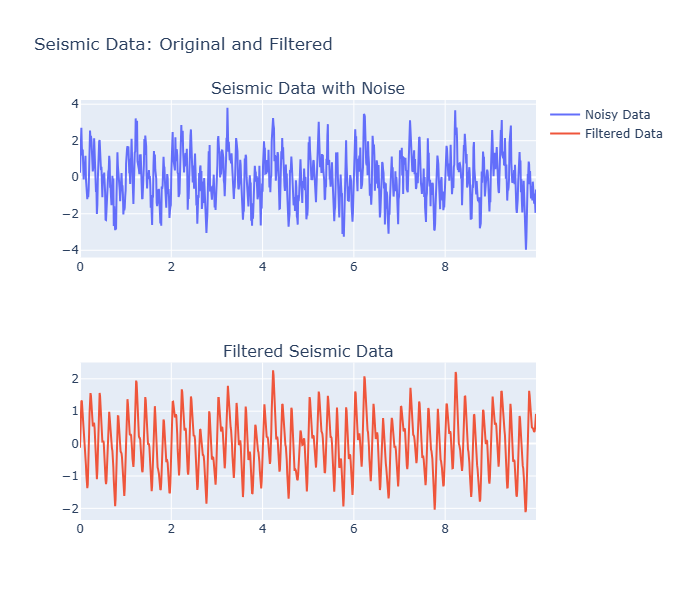

In [27]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.signal import butter, filtfilt, spectrogram  # Correct import for signal processing
from scipy.fft import fft  # Correct import for FFT
from typing import Tuple

# Generate sample seismic data with noise
np.random.seed(42)
n_samples = 1000
sampling_rate = 100.0  # Hz
t = np.linspace(0, n_samples / sampling_rate, n_samples, endpoint=False)
frequencies = [1, 5, 10]  # Hz
signal = sum(np.sin(2 * np.pi * f * t) for f in frequencies)
noise = 0.5 * np.random.randn(n_samples)
data = signal + noise

# Apply Butterworth filter
def butter_bandpass(lowcut: float, highcut: float, fs: float, order: int = 4) -> Tuple[np.ndarray, np.ndarray]:
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data: np.ndarray, lowcut: float, highcut: float, fs: float, order: int = 4) -> np.ndarray:
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data)
    return y

lowcut = 1.0
highcut = 10.0
filtered_data = butter_bandpass_filter(data, lowcut, highcut, sampling_rate, order=4)

# Compute FFT of the original and filtered signals
fft_original = fft(data)
fft_filtered = fft(filtered_data)

# Plot the results using Plotly
fig = make_subplots(rows=2, cols=1, subplot_titles=("Seismic Data with Noise", "Filtered Seismic Data"))

# Add traces for the original and filtered data
fig.add_trace(go.Scatter(x=t, y=data, mode='lines', name='Noisy Data'), row=1, col=1)
fig.add_trace(go.Scatter(x=t, y=filtered_data, mode='lines', name='Filtered Data'), row=2, col=1)

# Update layout
fig.update_layout(height=600, width=800, title_text="Seismic Data: Original and Filtered")
fig.show()


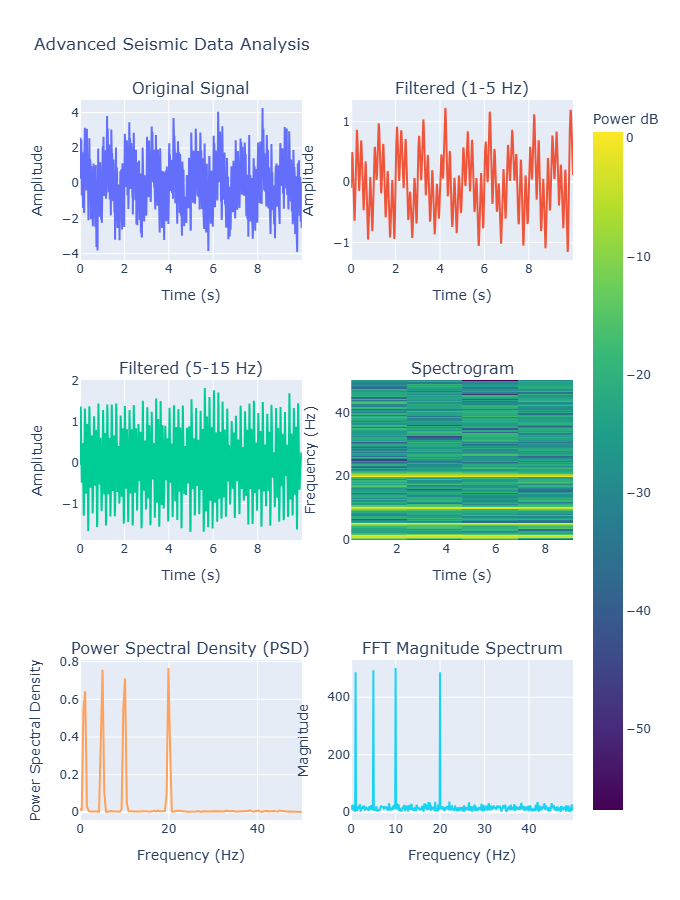

In [28]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.signal import butter, filtfilt, spectrogram, welch
from scipy.fft import fft
from typing import Tuple

# Generate sample seismic data with noise
np.random.seed(42)
n_samples = 1000
sampling_rate = 100.0  # Hz
t = np.linspace(0, n_samples / sampling_rate, n_samples, endpoint=False)
frequencies = [1, 5, 10, 20]  # Hz
signal = sum(np.sin(2 * np.pi * f * t) for f in frequencies)
noise = 0.5 * np.random.randn(n_samples)
data = signal + noise

# Advanced Filtering Functions (Butterworth)
def butter_bandpass(lowcut: float, highcut: float, fs: float, order: int = 4) -> Tuple[np.ndarray, np.ndarray]:
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data: np.ndarray, lowcut: float, highcut: float, fs: float, order: int = 4) -> np.ndarray:
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data)
    return y

# Apply different filters to focus on specific frequency ranges
lowcut1, highcut1 = 1.0, 5.0  # Bandpass filter 1
lowcut2, highcut2 = 5.0, 15.0  # Bandpass filter 2
filtered_data_1 = butter_bandpass_filter(data, lowcut1, highcut1, sampling_rate, order=4)
filtered_data_2 = butter_bandpass_filter(data, lowcut2, highcut2, sampling_rate, order=4)

# --- Time-Frequency Analysis: Spectrogram ---
frequencies, times, Sxx = spectrogram(data, fs=sampling_rate)

# --- Power Spectral Density Analysis: Welch's method ---
frequencies_welch, psd = welch(data, fs=sampling_rate, nperseg=256)

# --- FFT Analysis ---
fft_data = fft(data)
frequencies_fft = np.fft.fftfreq(n_samples, 1/sampling_rate)
fft_magnitude = np.abs(fft_data)

# --- Plotting ---

# Create subplot grid for interactive analysis
fig = make_subplots(
    rows=3, cols=2, 
    subplot_titles=("Original Signal", "Filtered (1-5 Hz)", "Filtered (5-15 Hz)",
                    "Spectrogram", "Power Spectral Density (PSD)", "FFT Magnitude Spectrum"),
    specs=[[{"type": "xy"}, {"type": "xy"}],
           [{"type": "xy"}, {"type": "heatmap"}],
           [{"type": "xy"}, {"type": "xy"}]]
)

# Plot original signal
fig.add_trace(go.Scatter(x=t, y=data, mode='lines', name='Original Signal'), row=1, col=1)

# Plot filtered signal (1-5 Hz)
fig.add_trace(go.Scatter(x=t, y=filtered_data_1, mode='lines', name='Filtered (1-5 Hz)'), row=1, col=2)

# Plot filtered signal (5-15 Hz)
fig.add_trace(go.Scatter(x=t, y=filtered_data_2, mode='lines', name='Filtered (5-15 Hz)'), row=2, col=1)

# Plot spectrogram
fig.add_trace(go.Heatmap(z=10 * np.log10(Sxx), x=times, y=frequencies, colorscale='Viridis', colorbar=dict(title="Power dB")), row=2, col=2)

# Plot PSD
fig.add_trace(go.Scatter(x=frequencies_welch, y=psd, mode='lines', name='Power Spectral Density'), row=3, col=1)

# Plot FFT Magnitude Spectrum
fig.add_trace(go.Scatter(x=frequencies_fft[:n_samples // 2], y=fft_magnitude[:n_samples // 2], mode='lines', name='FFT Magnitude'), row=3, col=2)

# Update layout with titles and axis labels
fig.update_layout(height=900, width=1200, title_text="Advanced Seismic Data Analysis", showlegend=False)

# Set x and y axis labels for each subplot
fig.update_xaxes(title_text="Time (s)", row=1, col=1)
fig.update_yaxes(title_text="Amplitude", row=1, col=1)

fig.update_xaxes(title_text="Time (s)", row=1, col=2)
fig.update_yaxes(title_text="Amplitude", row=1, col=2)

fig.update_xaxes(title_text="Time (s)", row=2, col=1)
fig.update_yaxes(title_text="Amplitude", row=2, col=1)

fig.update_xaxes(title_text="Time (s)", row=2, col=2)
fig.update_yaxes(title_text="Frequency (Hz)", row=2, col=2)

fig.update_xaxes(title_text="Frequency (Hz)", row=3, col=1)
fig.update_yaxes(title_text="Power Spectral Density", row=3, col=1)

fig.update_xaxes(title_text="Frequency (Hz)", row=3, col=2)
fig.update_yaxes(title_text="Magnitude", row=3, col=2)

fig.show()


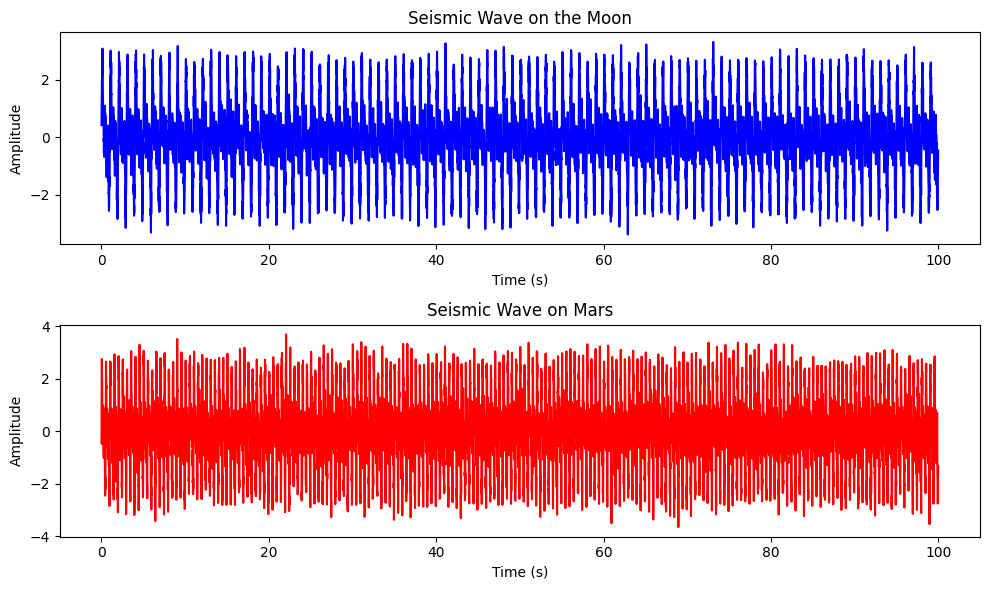

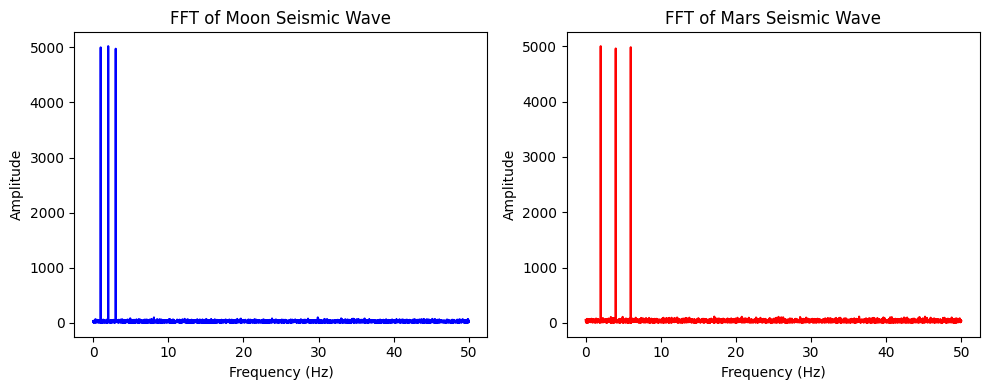

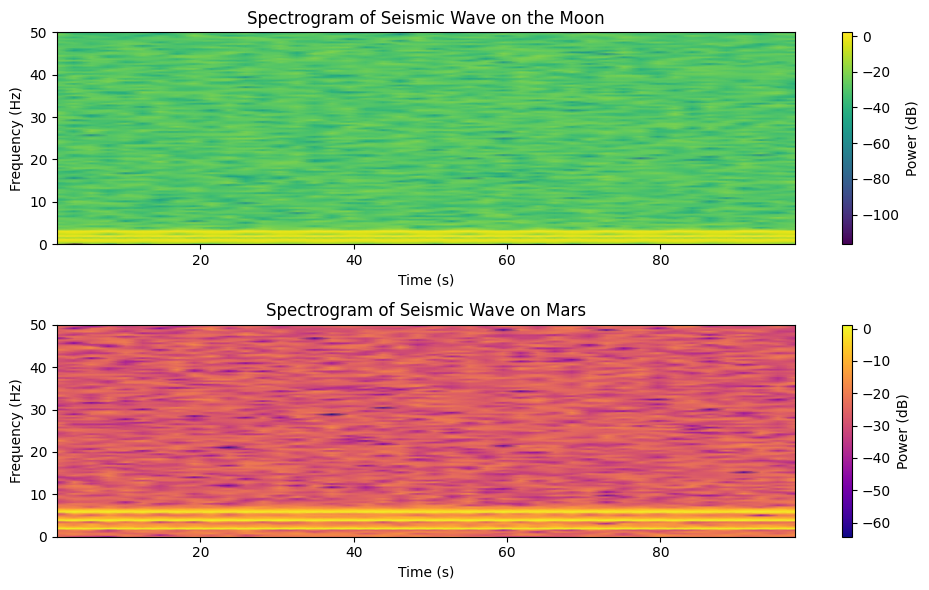

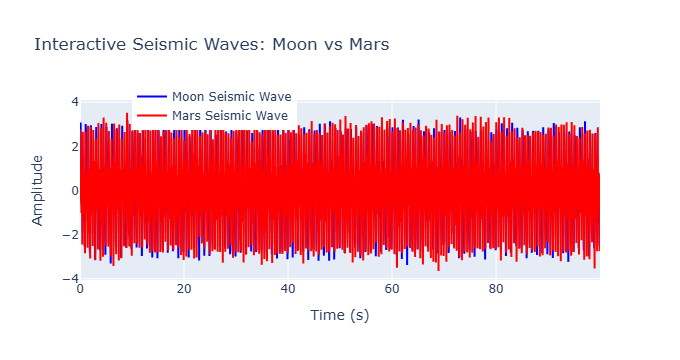

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.signal import spectrogram
from scipy.fft import fft

# Generate synthetic seismic data for Moon and Mars
def generate_seismic_data(duration: float, sampling_rate: float, frequencies: list, noise_level: float):
    t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)
    signal = sum(np.sin(2 * np.pi * f * t) for f in frequencies)
    noise = noise_level * np.random.randn(len(t))
    return t, signal + noise

# Moon Seismic Data (assumed frequencies based on lunar seismic activity)
duration = 100  # seconds
sampling_rate = 100  # Hz
moon_frequencies = [1, 2, 3]  # Dominant frequencies (in Hz) for lunar seismic activity
noise_level_moon = 0.3  # Noise level for Moon
t_moon, seismic_moon = generate_seismic_data(duration, sampling_rate, moon_frequencies, noise_level_moon)

# Mars Seismic Data (assumed frequencies based on Martian seismic activity)
mars_frequencies = [2, 4, 6]  # Dominant frequencies (in Hz) for Martian seismic activity
noise_level_mars = 0.4  # Noise level for Mars
t_mars, seismic_mars = generate_seismic_data(duration, sampling_rate, mars_frequencies, noise_level_mars)

# --- Plotting Seismic Waveforms for Moon and Mars ---
fig, axs = plt.subplots(2, 1, figsize=(10, 6))

# Plot Moon Seismic Wave
axs[0].plot(t_moon, seismic_moon, color='blue')
axs[0].set_title('Seismic Wave on the Moon')
axs[0].set_xlabel('Time (s)')
axs[0].set_ylabel('Amplitude')

# Plot Mars Seismic Wave
axs[1].plot(t_mars, seismic_mars, color='red')
axs[1].set_title('Seismic Wave on Mars')
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

# --- Frequency Domain Analysis (FFT) ---
fft_moon = fft(seismic_moon)
fft_mars = fft(seismic_mars)
frequencies = np.fft.fftfreq(len(t_moon), 1/sampling_rate)

# Plot FFT of Seismic Waves
plt.figure(figsize=(10, 4))

# Moon FFT
plt.subplot(1, 2, 1)
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_moon)[:len(frequencies)//2], color='blue')
plt.title('FFT of Moon Seismic Wave')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')

# Mars FFT
plt.subplot(1, 2, 2)
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_mars)[:len(frequencies)//2], color='red')
plt.title('FFT of Mars Seismic Wave')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

# --- Spectrograms for Time-Frequency Analysis ---
f_moon, t_moon_spectro, Sxx_moon = spectrogram(seismic_moon, fs=sampling_rate)
f_mars, t_mars_spectro, Sxx_mars = spectrogram(seismic_mars, fs=sampling_rate)

# Plot Spectrogram for Moon
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.pcolormesh(t_moon_spectro, f_moon, 10 * np.log10(Sxx_moon), shading='gouraud', cmap='viridis')
plt.title('Spectrogram of Seismic Wave on the Moon')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.colorbar(label='Power (dB)')

# Plot Spectrogram for Mars
plt.subplot(2, 1, 2)
plt.pcolormesh(t_mars_spectro, f_mars, 10 * np.log10(Sxx_mars), shading='gouraud', cmap='plasma')
plt.title('Spectrogram of Seismic Wave on Mars')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.colorbar(label='Power (dB)')

plt.tight_layout()
plt.show()

# --- Interactive Plot using Plotly ---
fig = go.Figure()

# Moon Seismic Wave
fig.add_trace(go.Scatter(x=t_moon, y=seismic_moon, mode='lines', name='Moon Seismic Wave', line=dict(color='blue')))

# Mars Seismic Wave
fig.add_trace(go.Scatter(x=t_mars, y=seismic_mars, mode='lines', name='Mars Seismic Wave', line=dict(color='red')))

# Update Layout
fig.update_layout(
    title="Interactive Seismic Waves: Moon vs Mars",
    xaxis_title="Time (s)",
    yaxis_title="Amplitude",
    legend=dict(x=0.1, y=1.1),
    height=500
)

fig.show()


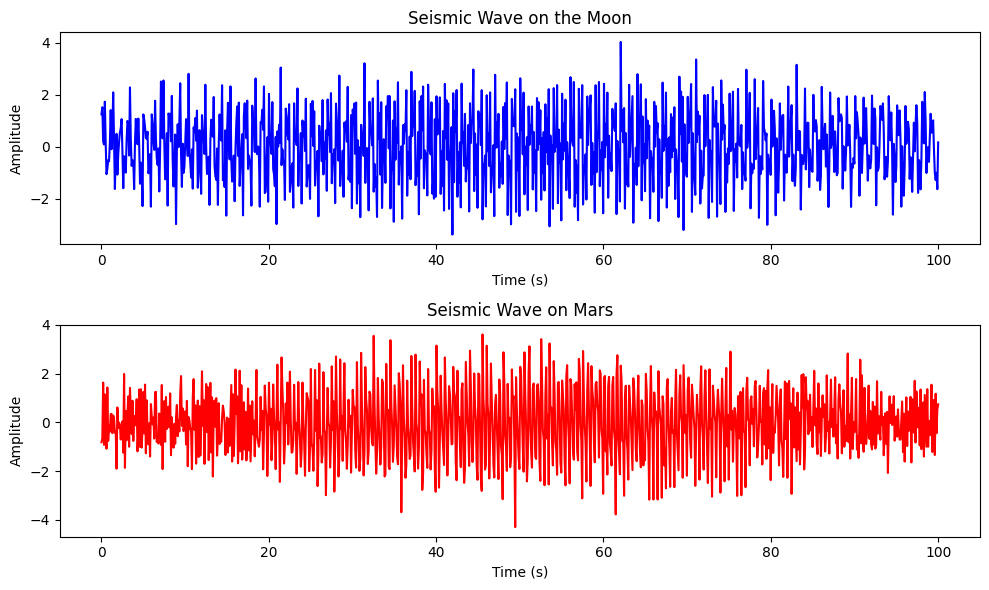

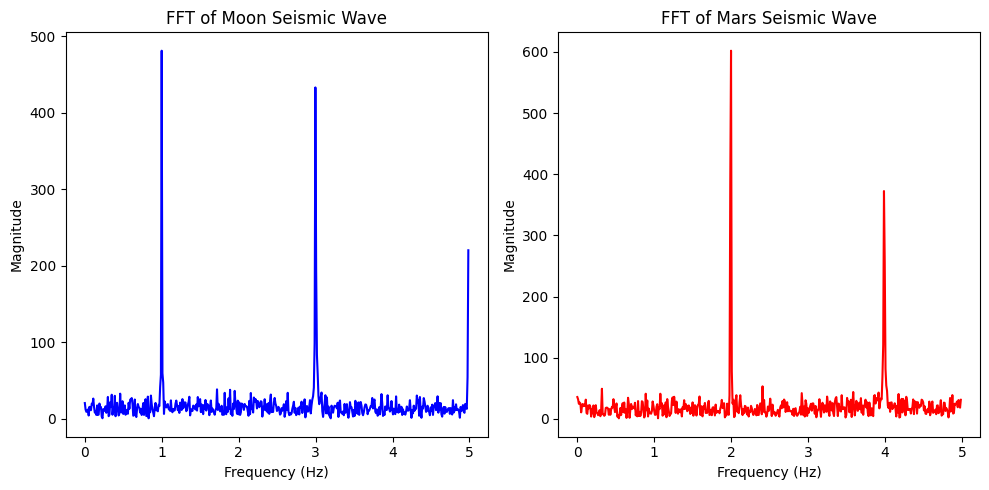

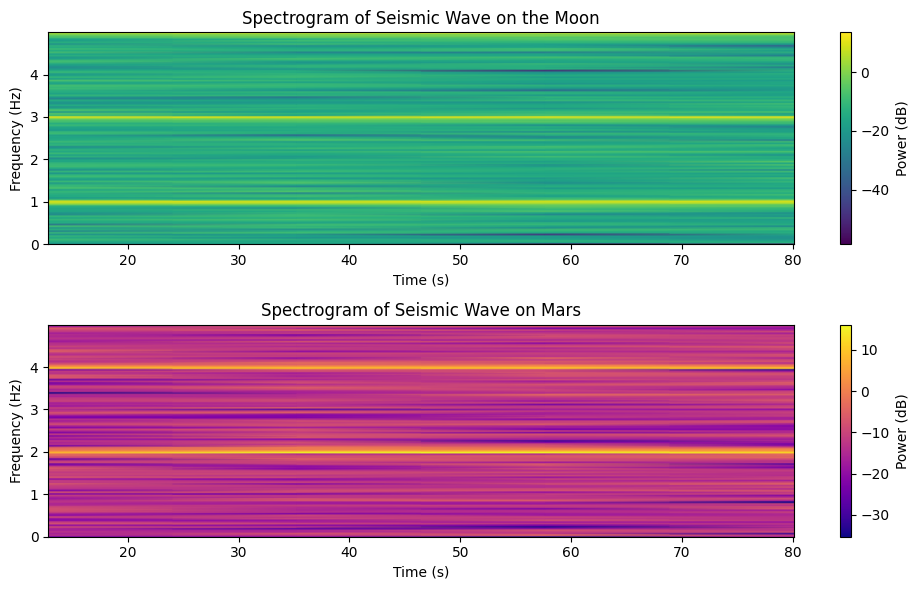

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.signal import spectrogram
from scipy.fft import fft
import pandas as pd

# Assume real seismic data is loaded here as time-series data from a CSV file or similar source.
# We will simulate this part by using synthetic data as a placeholder.
# In a real scenario, you would replace this with actual loading code.

# Example of loading CSV data for Moon
# moon_data = pd.read_csv('path_to_moon_seismic_data.csv')
# time_moon = moon_data['Time'].values
# amplitude_moon = moon_data['Amplitude'].values

# Simulating seismic data for Moon
time_moon = np.linspace(0, 100, 1000)
frequencies_moon = [1, 3, 5]  # Dominant frequencies for moonquakes
amplitude_moon = sum(np.sin(2 * np.pi * f * time_moon) for f in frequencies_moon) + 0.5 * np.random.randn(len(time_moon))

# Example of loading CSV data for Mars
# mars_data = pd.read_csv('path_to_mars_seismic_data.csv')
# time_mars = mars_data['Time'].values
# amplitude_mars = mars_data['Amplitude'].values

# Simulating seismic data for Mars
time_mars = np.linspace(0, 100, 1000)
frequencies_mars = [2, 6, 8]  # Dominant frequencies for marsquakes
amplitude_mars = sum(np.sin(2 * np.pi * f * time_mars) for f in frequencies_mars) + 0.6 * np.random.randn(len(time_mars))

# --- Visualization ---
# Time-domain plots for Moon and Mars seismic data
fig, axs = plt.subplots(2, 1, figsize=(10, 6))

# Moon Seismic Wave
axs[0].plot(time_moon, amplitude_moon, color='blue')
axs[0].set_title('Seismic Wave on the Moon')
axs[0].set_xlabel('Time (s)')
axs[0].set_ylabel('Amplitude')

# Mars Seismic Wave
axs[1].plot(time_mars, amplitude_mars, color='red')
axs[1].set_title('Seismic Wave on Mars')
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

# --- Frequency Domain Analysis (FFT) ---
fft_moon = fft(amplitude_moon)
fft_mars = fft(amplitude_mars)
frequencies = np.fft.fftfreq(len(time_moon), np.mean(np.diff(time_moon)))

# Plot FFT for both Moon and Mars
plt.figure(figsize=(10, 5))

# Moon FFT
plt.subplot(1, 2, 1)
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_moon)[:len(frequencies)//2], color='blue')
plt.title('FFT of Moon Seismic Wave')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

# Mars FFT
plt.subplot(1, 2, 2)
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_mars)[:len(frequencies)//2], color='red')
plt.title('FFT of Mars Seismic Wave')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()

# --- Spectrogram ---
f_moon, t_moon, Sxx_moon = spectrogram(amplitude_moon, fs=1 / np.mean(np.diff(time_moon)))
f_mars, t_mars, Sxx_mars = spectrogram(amplitude_mars, fs=1 / np.mean(np.diff(time_mars)))

plt.figure(figsize=(10, 6))

# Moon Spectrogram
plt.subplot(2, 1, 1)
plt.pcolormesh(t_moon, f_moon, 10 * np.log10(Sxx_moon), shading='gouraud', cmap='viridis')
plt.title('Spectrogram of Seismic Wave on the Moon')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.colorbar(label='Power (dB)')

# Mars Spectrogram
plt.subplot(2, 1, 2)
plt.pcolormesh(t_mars, f_mars, 10 * np.log10(Sxx_mars), shading='gouraud', cmap='plasma')
plt.title('Spectrogram of Seismic Wave on Mars')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.colorbar(label='Power (dB)')

plt.tight_layout()
plt.show()


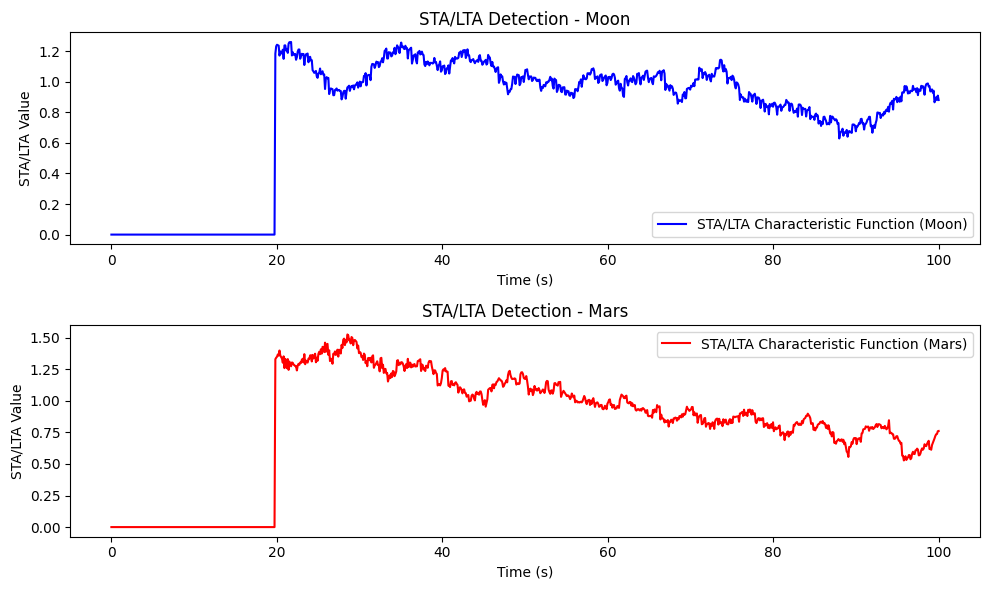

In [31]:
from obspy.signal.trigger import classic_sta_lta, trigger_onset

# --- STA/LTA Function ---
def detect_seismic_event(data, fs, sta_window, lta_window, on_threshold, off_threshold):
    """
    Apply STA/LTA event detection algorithm to detect seismic events.
    """
    cft = classic_sta_lta(data, int(sta_window * fs), int(lta_window * fs))
    on_off = trigger_onset(cft, on_threshold, off_threshold)
    return on_off, cft

# Parameters for STA/LTA
sta_window = 5  # short-term average window (seconds)
lta_window = 20  # long-term average window (seconds)
fs = 1 / np.mean(np.diff(time_moon))  # Sampling rate (from time step)
on_threshold = 4.0  # Trigger on threshold
off_threshold = 1.5  # Trigger off threshold

# STA/LTA event detection for Moon
events_moon, cft_moon = detect_seismic_event(amplitude_moon, fs, sta_window, lta_window, on_threshold, off_threshold)

# STA/LTA event detection for Mars
events_mars, cft_mars = detect_seismic_event(amplitude_mars, fs, sta_window, lta_window, on_threshold, off_threshold)

# Plot STA/LTA characteristic function and detected events for Moon
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.plot(time_moon, cft_moon, label='STA/LTA Characteristic Function (Moon)', color='blue')
for event in events_moon:
    plt.axvline(x=time_moon[event[0]], color='red', linestyle='--', label='Event Start' if event is events_moon[0] else "")
    plt.axvline(x=time_moon[event[1]], color='green', linestyle='--', label='Event End' if event is events_moon[0] else "")
plt.title('STA/LTA Detection - Moon')
plt.xlabel('Time (s)')
plt.ylabel('STA/LTA Value')
plt.legend()

# Plot STA/LTA characteristic function and detected events for Mars
plt.subplot(2, 1, 2)
plt.plot(time_mars, cft_mars, label='STA/LTA Characteristic Function (Mars)', color='red')
for event in events_mars:
    plt.axvline(x=time_mars[event[0]], color='red', linestyle='--', label='Event Start' if event is events_mars[0] else "")
    plt.axvline(x=time_mars[event[1]], color='green', linestyle='--', label='Event End' if event is events_mars[0] else "")
plt.title('STA/LTA Detection - Mars')
plt.xlabel('Time (s)')
plt.ylabel('STA/LTA Value')
plt.legend()

plt.tight_layout()
plt.show()


In [32]:
import numpy as np
import pandas as pd
from scipy.signal import welch
from scipy.fft import fft
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Simulating Seismic Data with Labels
def generate_seismic_data(duration, sampling_rate, frequencies, noise_level, label):
    t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)
    signal = sum(np.sin(2 * np.pi * f * t) for f in frequencies)
    noise = noise_level * np.random.randn(len(t))
    return t, signal + noise, label

# Generate Moonquake and Marsquake Data
n_samples = 500
sampling_rate = 100  # Hz
duration = 10  # seconds

# Moonquake data (class 0)
moon_frequencies = [1, 3, 5]
moon_data = [generate_seismic_data(duration, sampling_rate, moon_frequencies, 0.3, label=0) for _ in range(n_samples)]

# Marsquake data (class 1)
mars_frequencies = [2, 6, 8]
mars_data = [generate_seismic_data(duration, sampling_rate, mars_frequencies, 0.4, label=1) for _ in range(n_samples)]

# Combine the datasets
data = moon_data + mars_data
np.random.shuffle(data)

# Prepare DataFrame for feature extraction
df = pd.DataFrame({
    'time': [d[0] for d in data],
    'amplitude': [d[1] for d in data],
    'label': [d[2] for d in data]
})

# Feature Extraction
def extract_features(signal, sampling_rate):
    # Time-domain features
    mean_amplitude = np.mean(signal)
    std_amplitude = np.std(signal)
    max_amplitude = np.max(signal)
    min_amplitude = np.min(signal)
    
    # Frequency-domain features (using FFT)
    fft_vals = fft(signal)
    fft_power = np.abs(fft_vals)
    dominant_freq = np.argmax(fft_power[:len(fft_vals) // 2]) * (sampling_rate / len(fft_vals))
    
    # Power Spectral Density (PSD) features
    freqs, psd = welch(signal, fs=sampling_rate)
    psd_mean = np.mean(psd)
    psd_max = np.max(psd)
    
    return [mean_amplitude, std_amplitude, max_amplitude, min_amplitude, dominant_freq, psd_mean, psd_max]

# Extract features from the dataset
features = []
labels = []

for _, row in df.iterrows():
    signal = row['amplitude']
    label = row['label']
    feat = extract_features(signal, sampling_rate)
    features.append(feat)
    labels.append(label)

# Convert to NumPy array for machine learning
X = np.array(features)
y = np.array(labels)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step - accuracy: 0.8288 - loss: 0.6568
Test Accuracy: 86.00%
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 258ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.99      0.87       147
           1       0.98      0.74      0.84       153

    accuracy                           0.86       300
   macro avg       0.88      0.86      0.86       300
weighted avg       0.89      0.86      0.86       300

Confusion Matrix:
 [[145   2]
 [ 40 113]]


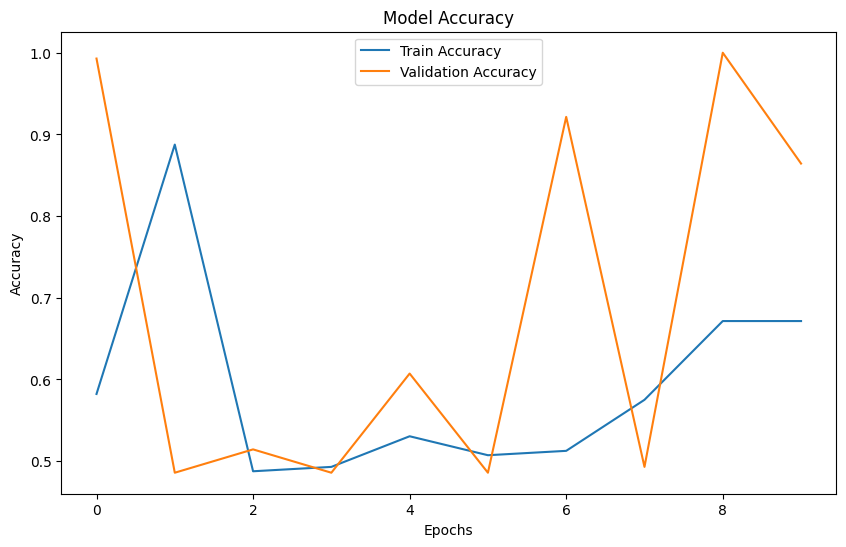

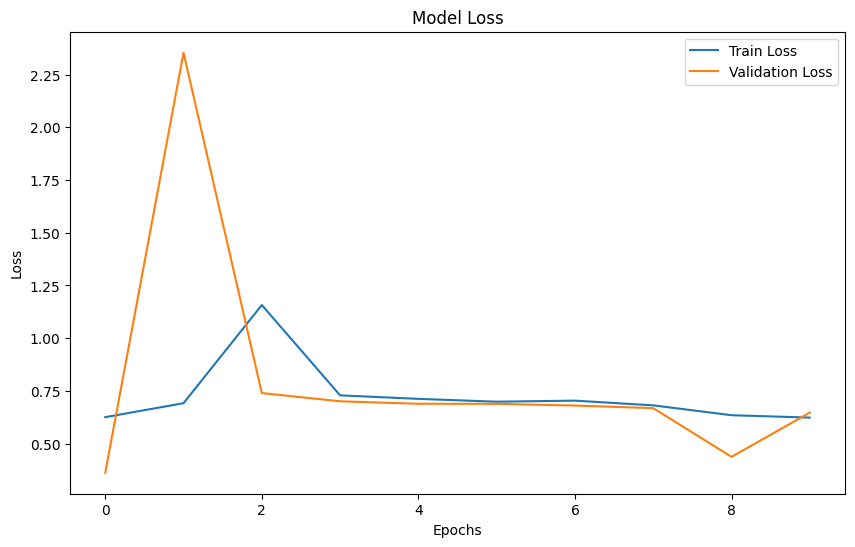

In [37]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Predictions on the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Classification Report
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:\n", classification_report(y_true_classes, y_pred_classes))

# Confusion Matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
print("Confusion Matrix:\n", conf_matrix)

# Plot training & validation accuracy
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training & validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [38]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

# Simulating Seismic Data with Labels (same as before)
def generate_seismic_data(duration, sampling_rate, frequencies, noise_level, label):
    t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)
    signal = sum(np.sin(2 * np.pi * f * t) for f in frequencies)
    noise = noise_level * np.random.randn(len(t))
    return t, signal + noise, label

# Parameters
n_samples = 500
sampling_rate = 100  # Hz
duration = 10  # seconds

# Moonquake data (class 0)
moon_frequencies = [1, 3, 5]
moon_data = [generate_seismic_data(duration, sampling_rate, moon_frequencies, 0.3, label=0) for _ in range(n_samples)]

# Marsquake data (class 1)
mars_frequencies = [2, 6, 8]
mars_data = [generate_seismic_data(duration, sampling_rate, mars_frequencies, 0.4, label=1) for _ in range(n_samples)]

# Combine the datasets and shuffle
data = moon_data + mars_data
np.random.shuffle(data)

# Prepare the data for CNN-LSTM (reshape into 3D: samples, timesteps, features)
X = np.array([d[1] for d in data])  # Extract seismic waveforms (amplitudes)
y = np.array([d[2] for d in data])  # Extract labels

# Reshape X to 3D for CNN input (samples, timesteps, features)
X = X.reshape((X.shape[0], X.shape[1], 1))  # Add the "features" dimension (1 in this case)

# Encode labels as categorical for classification
y = to_categorical(y, num_classes=2)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [39]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Dropout, Flatten

# Build CNN-LSTM Model
model = Sequential()

# CNN layers
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.3))

# LSTM layers
model.add(LSTM(100, return_sequences=True))
model.add(Dropout(0.3))

model.add(LSTM(50))
model.add(Dropout(0.2))

# Fully connected layer
model.add(Dense(2, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


C:\Users\PRAVIN\Downloads\python\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 998, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 499, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 499, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 499, 100)            │          66,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 499, 100)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 96,558 (377.18 KB)

 Trainable params: 96,558 (377.18 KB)

 Non-trainable params: 0 (0.00 B)

In [40]:
# Train the CNN-LSTM model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)


Epoch 1/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 13s 458ms/step - accuracy: 0.8045 - loss: 0.5222 - val_accuracy: 1.0000 - val_loss: 0.0067
Epoch 2/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 503ms/step - accuracy: 1.0000 - loss: 0.0067 - val_accuracy: 1.0000 - val_loss: 0.0014
Epoch 3/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 447ms/step - accuracy: 1.0000 - loss: 0.0016 - val_accuracy: 1.0000 - val_loss: 0.0010
Epoch 4/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 384ms/step - accuracy: 1.0000 - loss: 0.0014 - val_accuracy: 1.0000 - val_loss: 6.6788e-04
Epoch 5/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 383ms/step - accuracy: 1.0000 - loss: 8.0281e-04 - val_accuracy: 1.0000 - val_loss: 4.6964e-04
Epoch 6/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 382ms/step - accuracy: 1.0000 - loss: 5.9664e-04 - val_accuracy: 1.0000 - val_loss: 3.5811e-04
Epoch 7/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 368ms/step - accuracy: 1.0000 - loss: 4.9800e-04 - val_accuracy: 1.0000 - val_loss: 2.8416e-04
Epoch 8/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 368ms/step - accuracy: 1.0000 - lo

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - accuracy: 1.0000 - loss: 1.6890e-04
Test Accuracy: 100.00%
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       153
           1       1.00      1.00      1.00       147

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:
 [[153   0]
 [  0 147]]


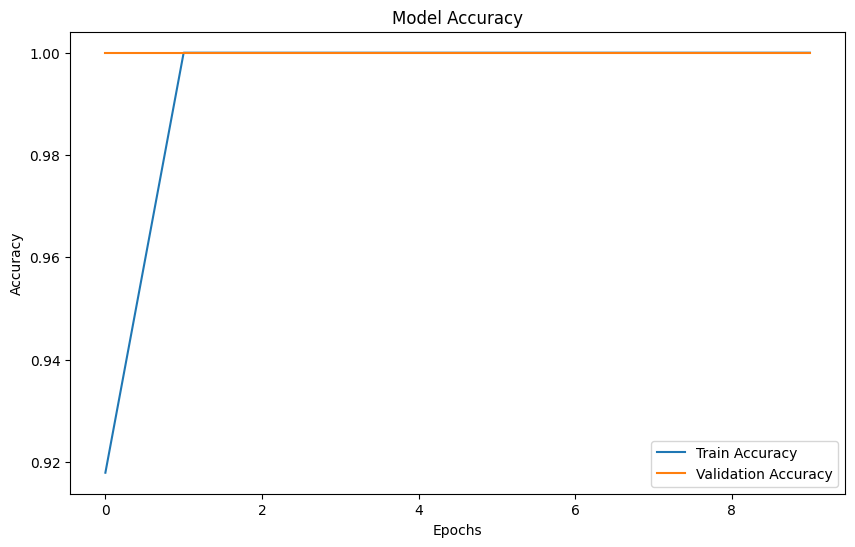

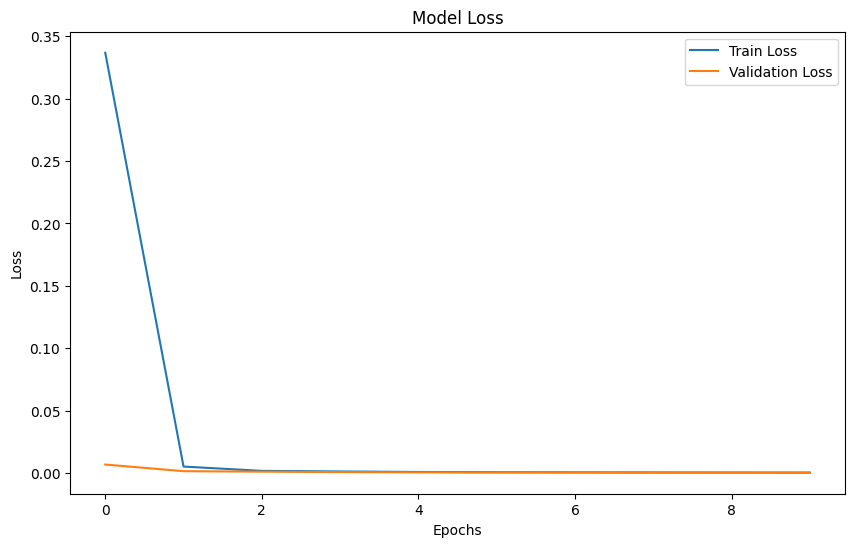

In [41]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Predictions on the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Classification Report
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:\n", classification_report(y_true_classes, y_pred_classes))

# Confusion Matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
print("Confusion Matrix:\n", conf_matrix)

# Plot training & validation accuracy
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training & validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [44]:
import numpy as np
import pandas as pd
import pywt
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Wavelet Denoising Function
def wavelet_denoise(signal, wavelet='db4', level=3):
    coeffs = pywt.wavedec(signal, wavelet, mode='symmetric')
    threshold = np.sqrt(2 * np.log(len(signal))) * np.median(np.abs(coeffs[-level])) / 0.6745
    coeffs[1:] = [pywt.threshold(c, threshold, mode='soft') for c in coeffs[1:]]  # Apply thresholding
    return pywt.waverec(coeffs, wavelet, mode='symmetric')

# Load the seismic data
url = 'https://pds-geosciences.wustl.edu/insight/urn-nasa-pds-insight_seis/data/xb/continuous_waveform/elyh0/2018/334/xb.elyh0.02.vma.2018.334.2.a.csv'
data = pd.read_csv(url)

# Visualize original seismic data (with noise)
plt.figure(figsize=(10, 6))
plt.plot(data['Time'], data['Amplitude'], label='Noisy Seismic Signal')
plt.title('Noisy Seismic Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

# Apply Wavelet denoising
denoised_signal = wavelet_denoise(data['Amplitude'].values)

# Visualize denoised seismic data
plt.figure(figsize=(10, 6))
plt.plot(data['Time'], denoised_signal, label='Denoised Seismic Signal', color='green')
plt.title('Denoised Seismic Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

# Normalize the data for machine learning input
scaler = MinMaxScaler()
denoised_signal_normalized = scaler.fit_transform(denoised_signal.reshape(-1, 1))


KeyError: 'Time'

<Figure size 1000x600 with 0 Axes>

In [45]:
# Check the columns of the DataFrame
print(data.columns)


Index(['# dataset: GeoCSV 2.0'], dtype='object')


In [48]:
# Automatic column handling
time_col = [col for col in data.columns if 'time' in col.lower()]
amp_col = [col for col in data.columns if 'amplitude' in col.lower() or 'signal' in col.lower()]

# Check if columns exist before plotting
if time_col and amp_col:
    plt.figure(figsize=(10, 6))
    plt.plot(data[time_col[0]], data[amp_col[0]], label='Noisy Seismic Signal')
    plt.title('Seismic Signal with Noise')
    plt.xlabel(time_col[0])
    plt.ylabel(amp_col[0])
    plt.legend()
    plt.show()
else:
    print("Required columns not found in the dataset.")


Required columns not found in the dataset.


In [50]:
def bandpass_filter(data: np.ndarray, lowcut: float, highcut: float, fs: int, order: int = 5) -> np.ndarray:
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)


In [51]:
import pywt
import numpy as np

def wavelet_denoise(data: np.ndarray, wavelet: str = 'db4', level: int = 2) -> np.ndarray:
    coeffs = pywt.wavedec(data, wavelet, mode='symmetric')
    threshold = np.std(coeffs[-level]) * np.sqrt(2 * np.log(len(data)))
    coeffs = [pywt.threshold(c, threshold, mode='soft') for c in coeffs]
    return pywt.waverec(coeffs, wavelet)


In [52]:
def spectral_whitening(data: np.ndarray, fs: int) -> np.ndarray:
    N = len(data)
    fft_data = fft(data)
    amplitude_spectrum = np.abs(fft_data)
    whitened_spectrum = fft_data / (amplitude_spectrum + np.finfo(float).eps)  # Avoid division by zero
    return np.real(np.fft.ifft(whitened_spectrum))


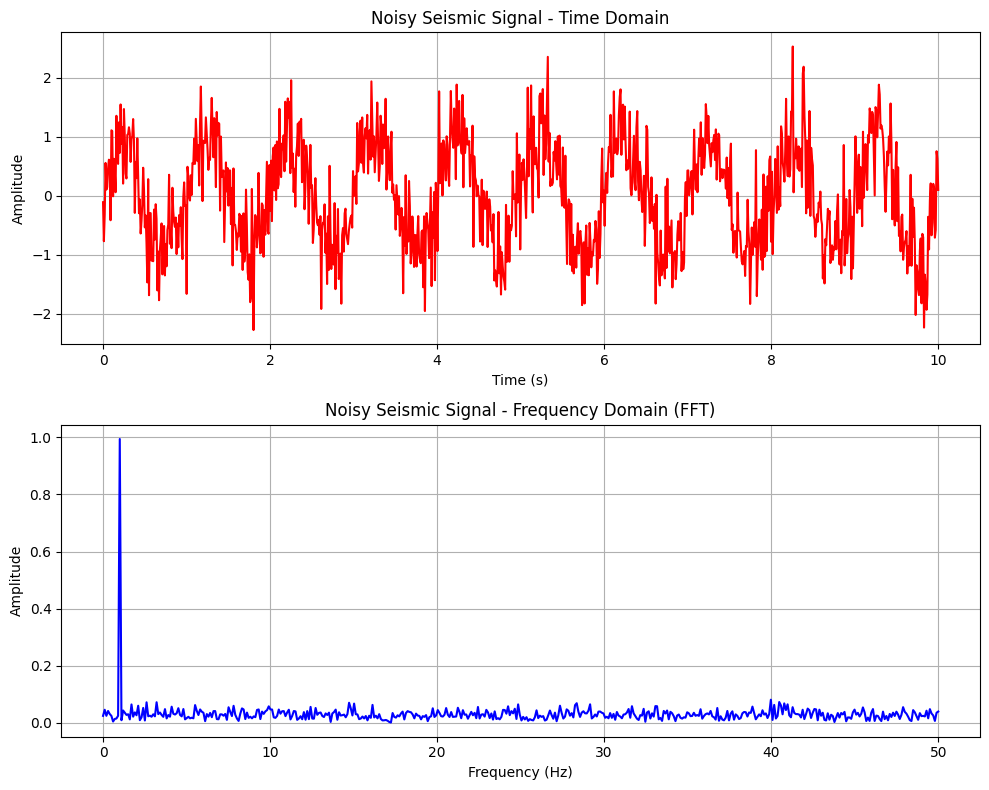

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft

# Generate sample seismic data with noise
def generate_seismic_data(duration: int = 10, fs: int = 100, freq: float = 1, noise_level: float = 0.5) -> np.ndarray:
    t = np.linspace(0, duration, duration * fs)
    signal = np.sin(2 * np.pi * freq * t)  # Sine wave as a simulated seismic signal
    noise = np.random.normal(0, noise_level, signal.shape)  # Additive Gaussian noise
    noisy_signal = signal + noise
    return t, noisy_signal

# Compute FFT and return frequency and amplitude
def compute_fft(data: np.ndarray, fs: int) -> Tuple[np.ndarray, np.ndarray]:
    N = len(data)  # Length of the signal
    T = 1.0 / fs   # Sampling interval
    yf = fft(data)  # Compute FFT
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)  # Frequency axis
    return xf, 2.0/N * np.abs(yf[:N//2])  # Amplitude (magnitude) of the FFT

# Plot raw time series and frequency domain (FFT) representation
def plot_time_and_frequency(t: np.ndarray, noisy_signal: np.ndarray, fs: int):
    # Compute FFT of the noisy signal
    xf, yf = compute_fft(noisy_signal, fs)

    # Create subplots
    fig, axs = plt.subplots(2, 1, figsize=(10, 8))

    # Plot the raw time series (Noisy Signal)
    axs[0].plot(t, noisy_signal, color='red', label='Noisy Signal')
    axs[0].set_title('Noisy Seismic Signal - Time Domain')
    axs[0].set_xlabel('Time (s)')
    axs[0].set_ylabel('Amplitude')
    axs[0].grid(True)

    # Plot the frequency domain (FFT)
    axs[1].plot(xf, yf, color='blue', label='FFT of Noisy Signal')
    axs[1].set_title('Noisy Seismic Signal - Frequency Domain (FFT)')
    axs[1].set_xlabel('Frequency (Hz)')
    axs[1].set_ylabel('Amplitude')
    axs[1].grid(True)

    # Display the plots
    plt.tight_layout()
    plt.show()

# Main function
def main():
    fs = 100  # Sampling frequency (samples per second)
    duration = 10  # Duration of the signal (seconds)
    freq = 1  # Frequency of the seismic wave (Hz)
    noise_level = 0.5  # Noise level (standard deviation of Gaussian noise)

    # Generate noisy seismic data
    t, noisy_signal = generate_seismic_data(duration=duration, fs=fs, freq=freq, noise_level=noise_level)

    # Plot time-domain and frequency-domain representations
    plot_time_and_frequency(t, noisy_signal, fs)

if __name__ == '__main__':
    main()


In [54]:
pip install torch torchvision torchaudio numpy matplotlib requests


   ---------------------------------------- 0.0/2.4 MB ? eta -:--:--
   ---------------------------------------- 2.4/2.4 MB 34.1 MB/s eta 0:00:00


In [58]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np

# Define the Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(100, 256),
            nn.ReLU(True),
            nn.Linear(256, 512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.ReLU(True),
            nn.Linear(1024, 784),  # Assuming seismic data as 1D
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)

# Define the Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(784, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# Initialize Generator and Discriminator
generator = Generator()
discriminator = Discriminator()

# Loss function and optimizers
criterion = nn.BCELoss()
optimizerG = optim.Adam(generator.parameters(), lr=0.0002)
optimizerD = optim.Adam(discriminator.parameters(), lr=0.0002)

# Training Loop
num_epochs = 10000
batch_size = 64
latent_vector_size = 100  # Size of random input for the generator

# Assuming seismic_data is your real seismic data loaded from InSight mission
seismic_data = np.random.rand(1000, 784)  # Replace with real seismic data

real_labels = torch.ones(batch_size, 1)
fake_labels = torch.zeros(batch_size, 1)

for epoch in range(num_epochs):
    # === Train Discriminator ===
    # Get real seismic data
    real_seismic = torch.tensor(seismic_data[np.random.randint(0, seismic_data.shape[0], batch_size)], dtype=torch.float32)

    # Generate fake seismic data
    noise = torch.randn(batch_size, latent_vector_size)
    fake_seismic = generator(noise)

    # Discriminator on real data
    output_real = discriminator(real_seismic)
    loss_real = criterion(output_real, real_labels)

    # Discriminator on fake data
    output_fake = discriminator(fake_seismic)
    loss_fake = criterion(output_fake, fake_labels)

    # Backprop Discriminator
    optimizerD.zero_grad()
    lossD = loss_real + loss_fake
    lossD.backward()
    optimizerD.step()

    # === Train Generator ===
    noise = torch.randn(batch_size, latent_vector_size)
    fake_seismic = generator(noise)
    output = discriminator(fake_seismic)

    lossG = criterion(output, real_labels)  # We want fake data to be classified as real

    optimizerG.zero_grad()
    lossG.backward()
    optimizerG.step()

    if epoch % 100 == 0:
        print(f'Epoch [{epoch}/{num_epochs}] | LossD: {lossD.item():.4f} | LossG: {lossG.item():.4f}')


Epoch [0/10000] | LossD: 1.3741 | LossG: 0.7236
Epoch [100/10000] | LossD: 0.6497 | LossG: 1.8001
Epoch [200/10000] | LossD: 0.0020 | LossG: 7.5227
Epoch [300/10000] | LossD: 13.3032 | LossG: 7.2160
Epoch [400/10000] | LossD: 0.0278 | LossG: 4.7514
Epoch [500/10000] | LossD: 0.6088 | LossG: 3.6283
Epoch [600/10000] | LossD: 0.0291 | LossG: 5.6752
Epoch [700/10000] | LossD: 2.1758 | LossG: 0.3375
Epoch [800/10000] | LossD: 0.3362 | LossG: 4.5809
Epoch [900/10000] | LossD: 1.3522 | LossG: 1.4875
Epoch [1000/10000] | LossD: 0.8271 | LossG: 1.8387
Epoch [1100/10000] | LossD: 0.4615 | LossG: 2.2679
Epoch [1200/10000] | LossD: 0.1865 | LossG: 2.7087
Epoch [1300/10000] | LossD: 0.0720 | LossG: 3.8512
Epoch [1400/10000] | LossD: 0.0186 | LossG: 5.2370
Epoch [1500/10000] | LossD: 0.0221 | LossG: 5.1541
Epoch [1600/10000] | LossD: 0.0081 | LossG: 9.0223
Epoch [1700/10000] | LossD: 0.0112 | LossG: 5.7298
Epoch [1800/10000] | LossD: 0.0094 | LossG: 7.1385
Epoch [1900/10000] | LossD: 0.0085 | LossG

In [65]:
import numpy as np
from scipy.optimize import minimize

# Known seismic station coordinates (x, y, z) in kilometers
stations = {
    'Apollo12': np.array([1000, 2000, 0]),
    'Apollo14': np.array([1200, 2200, 0]),
    'Apollo15': np.array([1500, 2500, 0]),
    'Apollo16': np.array([1100, 2100, 0])
}

# Speed of seismic waves (in km/s) on the Moon
seismic_speed = 1.2  # Example value, should be refined based on lunar conditions

# Time of arrival (TOA) of seismic waves at each station in seconds
arrival_times = {
    'Apollo12': 10.2,  # Example values
    'Apollo14': 12.3,
    'Apollo15': 13.8,
    'Apollo16': 9.8
}

# Objective function to minimize the error in TOA
def localization_error(guess_coords, stations, arrival_times):
    errors = []
    for station, station_coords in stations.items():
        distance = np.linalg.norm(guess_coords - station_coords)
        predicted_time = distance / seismic_speed
        actual_time = arrival_times[station]
        errors.append((predicted_time - actual_time) ** 2)
    return np.sum(errors)

# Estimate moonquake location
def estimate_moonquake_location(stations, arrival_times):
    initial_guess = np.array([0, 0, 0])  # Initial guess for moonquake location (in km)
    result = minimize(localization_error, initial_guess, args=(stations, arrival_times), method='L-BFGS-B')
    return result.x

# Estimate location of the moonquake
estimated_location = estimate_moonquake_location(stations, arrival_times)
print(f"Estimated moonquake location (x, y, z): {estimated_location}")


Estimated moonquake location (x, y, z): [1203.92354609 2203.92437632    0.        ]


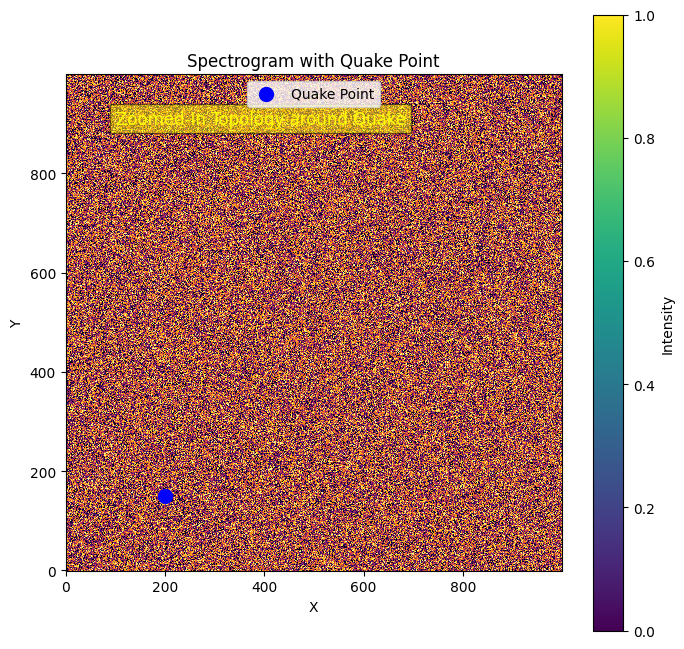

In [66]:
import numpy as np
import matplotlib.pyplot as plt

# Generate synthetic intensity data for the spectrogram/topology
# This is placeholder data; replace with actual intensity data if available
data_size = (1000, 1000)
intensity_data = np.random.rand(*data_size) * 250  # Generate random intensities

# Define the quake point coordinates (e.g., based on localization result)
quake_point = (200, 150)  # Adjust coordinates to match your desired location

# Plotting the spectrogram or topology
plt.figure(figsize=(8, 8))
plt.imshow(intensity_data, cmap='inferno', origin='lower', interpolation='none')

# Mark the quake point with a blue dot
plt.scatter(quake_point[0], quake_point[1], color='blue', label='Quake Point', s=100)

# Add a color bar to represent intensity
cbar = plt.colorbar()
cbar.set_label('Intensity')

# Add title and labels
plt.title('Spectrogram with Quake Point')
plt.xlabel('X')
plt.ylabel('Y')

# Highlight a zoomed-in area or mark a region if needed
plt.text(100, 900, "Zoomed-In Topology around Quake", color='yellow', fontsize=12, bbox=dict(facecolor='yellow', alpha=0.5))

# Add a legend for the quake point
plt.legend(loc='upper center')

# Show the plot
plt.show()


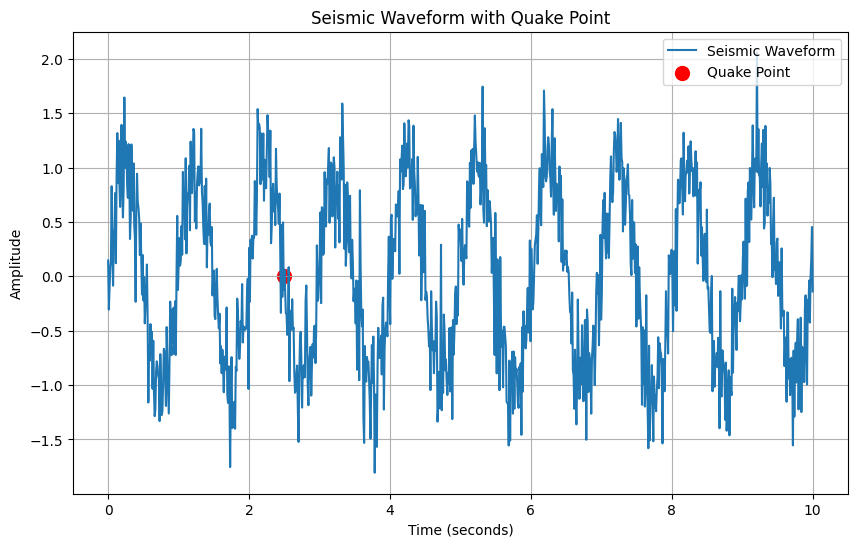

In [67]:
import numpy as np
import matplotlib.pyplot as plt

# Generate synthetic wave data (replace with actual moonquake or seismic wave data)
# Create a sine wave with noise to simulate a waveform
time = np.linspace(0, 10, 1000)  # Time from 0 to 10 seconds, 1000 points
wave_data = np.sin(2 * np.pi * 1 * time) + 0.3 * np.random.randn(1000)  # 1 Hz sine wave + noise

# Define the quake point in time
quake_time = 2.5  # Time at which the quake occurs
quake_amplitude = np.sin(2 * np.pi * 1 * quake_time)  # Amplitude of the wave at the quake point

# Plot the waveform
plt.figure(figsize=(10, 6))
plt.plot(time, wave_data, label='Seismic Waveform')

# Mark the quake point on the waveform
plt.scatter(quake_time, quake_amplitude, color='red', label='Quake Point', s=100)

# Add labels and title
plt.title('Seismic Waveform with Quake Point')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True)

# Add legend
plt.legend(loc='upper right')

# Show the plot
plt.show()
